# **Traffic Sign Recognition Using CNNs**


## Subject: Deep Learning


### Team Members
1. Jaimis Miyani (400551743)
2. Kenil Sachapara (400551600)
3. Om Kakadiya (400551508)
4. Yash Patel (400551627)

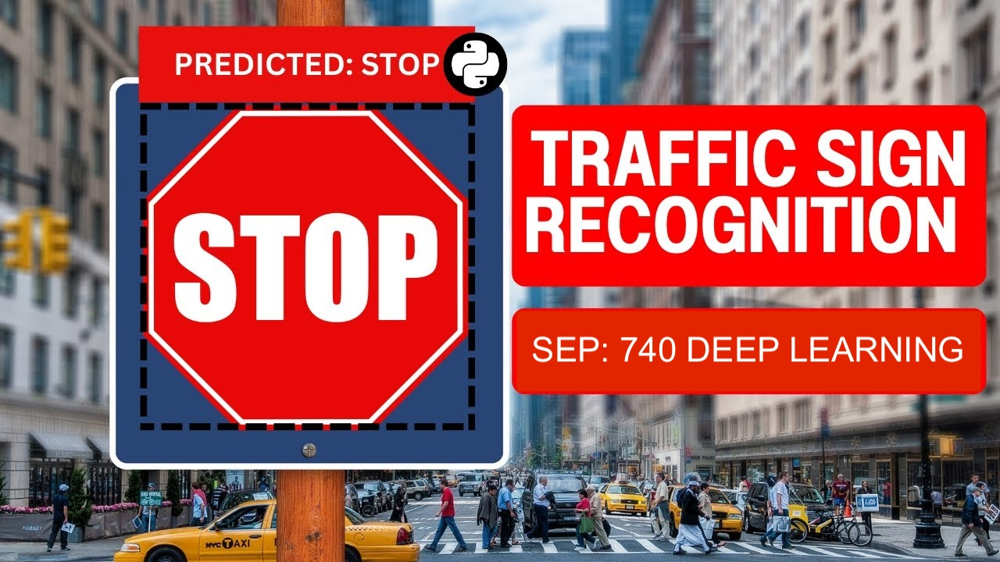

## Importing libraries

In [1]:
# Fundamental libraries for data manipulation and deep learning
import numpy as np  # For numerical operations
import pandas as pd  # For data manipulation and analysis
import tensorflow as tf  # For building and training deep learning models
import os  # For interacting with the operating system (e.g., reading directories)

# Libraries for image processing
import cv2  # OpenCV for image processing tasks
from PIL import Image  # Pillow for image manipulation
from matplotlib.image import imread  # For reading images using matplotlib

# Library for data visualization
import matplotlib.pyplot as plt  # For plotting graphs and images
import seaborn as sns  # For plotting data distribution
from mpl_toolkits.mplot3d import Axes3D  # For 3D plotting


# Libraries for model creation and training
from sklearn.preprocessing import StandardScaler  # For feature scaling
from sklearn.model_selection import train_test_split  # For splitting data into training and testing sets
from tensorflow.keras.utils import to_categorical  # For converting class vectors to binary class matrices
from tensorflow.keras.models import Sequential, load_model  # For creating a linear stack of layers and loading pre-trained models
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Dropout  # Core layers for building CNNs
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img  # Utilities for image preprocessing

#Performance Plot
from sklearn import metrics
from sklearn.metrics import f1_score, accuracy_score,confusion_matrix,classification_report
import seaborn as sns


2024-07-28 07:26:28.770893: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [17]:
# Define the path to the dataset assets
assets_path = '/Users/jaimismiyani/Desktop/McMaster/DL/DL Project/assets'

In [3]:
def get_formatted_datetime(format_option):
    """
    Get the current date and time formatted according to the specified option.

    Parameters:
    - format_option (int): The formatting option (1, 2, 3, or 4).

    Returns:
    - str: The formatted date and/or time as a string.
    """
    now = datetime.now()  # Get the current date and time
    today = date.today()  # Get the current date

    if format_option == 1:
        return 'Timestamp: {:%Y-%m-%d %H:%M:%S}'.format(now)
    elif format_option == 2:
        return 'Timestamp: {:%Y-%b-%d %H:%M:%S}'.format(now)
    elif format_option == 3:
        return 'Date now: {}'.format(now)
    elif format_option == 4:
        return 'Date today: {}'.format(today)
    else:
        return 'Invalid format option. Please choose between 1 and 4.'


In [4]:
import matplotlib.pyplot as plt

def plot_performance(history, figure_directory=None, ylim_pad=[0, 0]):
    """
    Plot the training and validation performance of the model.

    Parameters:
    - history (tf.keras.callbacks.History): The history object returned by the fit method of a Keras model.
    - figure_directory (str, optional): Directory to save the plot. If None, the plot will not be saved.
    - ylim_pad (list, optional): Padding to add to the y-axis limits [accuracy_pad, loss_pad].

    Returns:
    - None
    """
    # Labels and legends
    xlabel = 'Epoch'
    legends = ['Training', 'Validation']

    # Set up the figure size
    plt.figure(figsize=(20, 5))

    # Extract accuracy data
    train_accuracy = history.history['accuracy']
    val_accuracy = history.history['val_accuracy']

    # Calculate y-axis limits for accuracy
    min_accuracy = min(min(train_accuracy), min(val_accuracy)) - ylim_pad[0]
    max_accuracy = max(max(train_accuracy), max(val_accuracy)) + ylim_pad[0]

    # Plot training and validation accuracy
    plt.subplot(121)
    plt.plot(train_accuracy)
    plt.plot(val_accuracy)
    plt.title('Model Accuracy\n' + get_formatted_datetime(1), fontsize=17)
    plt.xlabel(xlabel, fontsize=15)
    plt.ylabel('Accuracy', fontsize=15)
    plt.ylim(min_accuracy, max_accuracy)
    plt.legend(legends, loc='upper left')
    plt.grid()

    # Extract loss data
    train_loss = history.history['loss']
    val_loss = history.history['val_loss']

    # Calculate y-axis limits for loss
    min_loss = min(min(train_loss), min(val_loss)) - ylim_pad[1]
    max_loss = max(max(train_loss), max(val_loss)) + ylim_pad[1]

    # Plot training and validation loss
    plt.subplot(122)
    plt.plot(train_loss)
    plt.plot(val_loss)
    plt.title('Model Loss\n' + get_formatted_datetime(1), fontsize=17)
    plt.xlabel(xlabel, fontsize=15)
    plt.ylabel('Loss', fontsize=15)
    plt.ylim(min_loss, max_loss)
    plt.legend(legends, loc='upper left')
    plt.grid()

    # Save the plot if a directory is provided
    if figure_directory:
        plt.savefig(os.path.join(figure_directory, "performance_history.png"))

    # Show the plot
    plt.show()


In [18]:
import os
print(os.listdir(assets_path))

['Train copy', '.DS_Store', 'Test', 'Test.csv', 'Meta', 'Train', 'Meta.csv', 'Train.csv']


## Data augmentation 

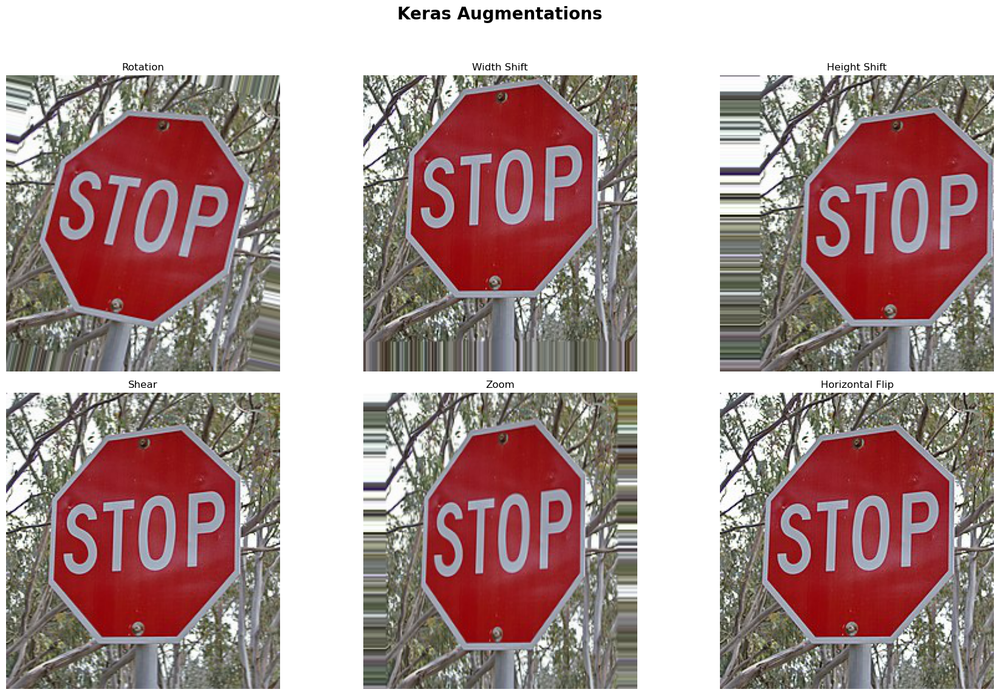

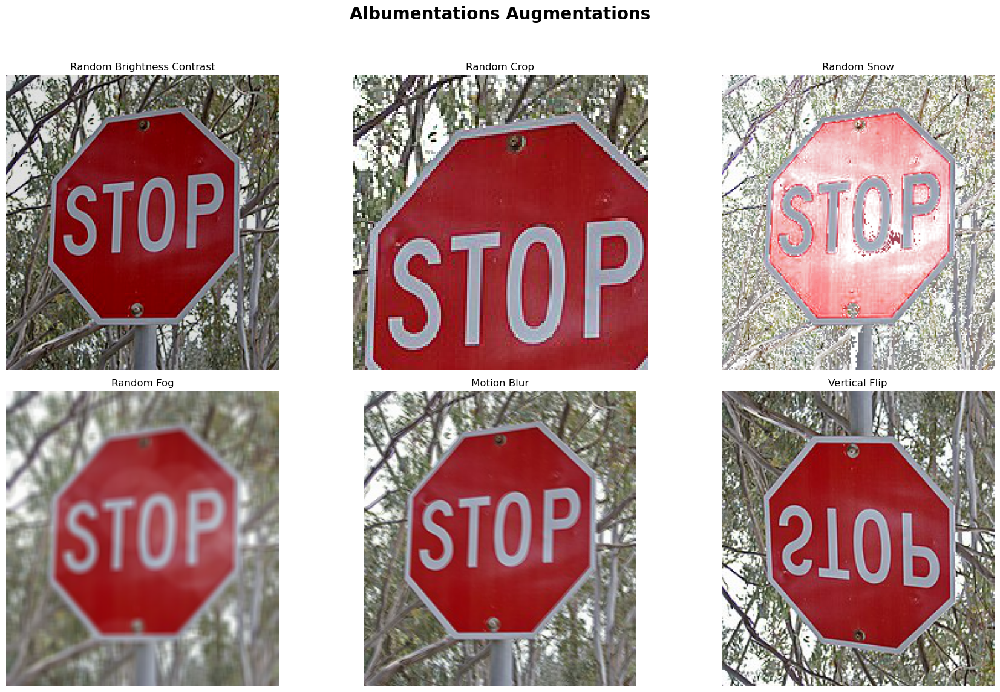

In [6]:
import os
import matplotlib.pyplot as plt
from keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
import albumentations as A
import numpy as np

# Define the path to the image
image_path = os.path.join(assets_path, '/Train/aug', 'stop.png')

# Load and prepare the image
img = load_img(image_path)  # Load the image as a PIL image
image_array = img_to_array(img)  # Convert the PIL image to a NumPy array
image_array = image_array.astype(np.uint8)  # Ensure the array is of type uint8

# Define individual Keras augmentation configurations
keras_augmentations = {
    'Rotation': ImageDataGenerator(rotation_range=30),
    'Width Shift': ImageDataGenerator(width_shift_range=0.2),
    'Height Shift': ImageDataGenerator(height_shift_range=0.2),
    'Shear': ImageDataGenerator(shear_range=0.2),
    'Zoom': ImageDataGenerator(zoom_range=0.2),
    'Horizontal Flip': ImageDataGenerator(horizontal_flip=True)
}

# Define individual Albumentations augmentation configurations
albumentations_augmentations = {
    'Random Brightness Contrast': A.RandomBrightnessContrast(p=1.0),
    'Random Crop': A.RandomCrop(width=150, height=150, p=1.0),
    'Random Snow': A.RandomSnow(p=1.0),
    'Random Fog': A.RandomFog(p=1.0),
    'Motion Blur': A.MotionBlur(p=1.0),
    'Vertical Flip': A.VerticalFlip(p=1.0)
}

# Plot Keras augmentations
plt.figure(figsize=(18, 12))
plt.suptitle('Keras Augmentations', fontsize=20, weight='bold')

# Apply and plot each Keras augmentation
subplot_index = 1
for aug_name, aug_gen in keras_augmentations.items():
    for batch in aug_gen.flow(image_array.reshape((1,) + image_array.shape), batch_size=1):
        plt.subplot(2, 3, subplot_index)
        plt.imshow(batch[0].astype('uint8'))
        plt.title(aug_name)
        plt.axis('off')
        subplot_index += 1
        break  # Only show one example for each augmentation

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to make room for the title
plt.show()

# Plot Albumentations augmentations
plt.figure(figsize=(18, 12))
plt.suptitle('Albumentations Augmentations', fontsize=20, weight='bold')

# Apply and plot each Albumentations augmentation
subplot_index = 1
for aug_name, aug in albumentations_augmentations.items():
    augmented_image = aug(image=image_array)['image']
    plt.subplot(2, 3, subplot_index)
    plt.imshow(augmented_image)
    plt.title(aug_name)
    plt.axis('off')
    subplot_index += 1

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to make room for the title
plt.show()


In [7]:
path = os.path.join(assets_path, 'Train', 'aug')
images = os.listdir(path)

datagen = ImageDataGenerator(
        rotation_range=40,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest')

root_dir = os.path.join(assets_path, 'Train')

# Iterate through each subfolder
for subdir, _, files in os.walk(root_dir):
    if files:  # Only process if the subdirectory contains files
        for file_name in files:
            if file_name.endswith(('.png', '.jpg', '.jpeg')):  # Process only image files
                image_path = os.path.join(subdir, file_name)

                img = load_img(image_path)  # this is a PIL image
                x = img_to_array(img)  # this is a Numpy array with shape (3, 150, 150)
                x = x.reshape((1,) + x.shape)  # this is a Numpy array with shape (1, 3, 150, 150)

                # Generating 2 augmented images for each input image and saving them to the same subfolder
                i = 0
                for batch in datagen.flow(x, batch_size=1, save_to_dir=subdir, save_prefix='aug', save_format='png'):
                    i += 1
                    if i >= 2:  # Generate 2 augmented images for each input image
                        break

## Loading dataset

In [8]:
# Setting variables for later use
data = []  # List to store image data
labels = []  # List to store corresponding labels
num_classes = 43  # Total number of classes
current_path = os.getcwd()  # Get the current working directory

# Retrieving the images and their labels
for class_id in range(num_classes):
    # Define the path to the images for the current class
    class_path = os.path.join(assets_path, 'Train', str(class_id))
    image_files = os.listdir(class_path)  # List all files in the class directory

    # Loop through each image file in the current class directory
    for image_file in image_files:
        try:
            # Open the image file
            image = Image.open(os.path.join(class_path, image_file))
            # Resize the image to 30x30 pixels
            image = image.resize((30, 30))
            # Convert the image to a NumPy array
            image_array = np.array(image)
            # Append the image data and corresponding label to the lists
            data.append(image_array)
            labels.append(class_id)
        except Exception as e:
            print(f"Error loading image {image_file}: {e}")

# Converting lists into numpy arrays
data = np.array(data)
labels = np.array(labels)

# Output the shapes of the data and labels arrays for verification
print(f"Data shape: {data.shape}")
print(f"Labels shape: {labels.shape}")


Error loading image .DS_Store: cannot identify image file '/Users/jaimismiyani/Desktop/McMaster/DL/DL Project/archive/Train/35/.DS_Store'
Data shape: (110205, 30, 30, 3)
Labels shape: (110205,)


## Exploratory Data Analysis

##### 1. Visualizing the Class Distribution

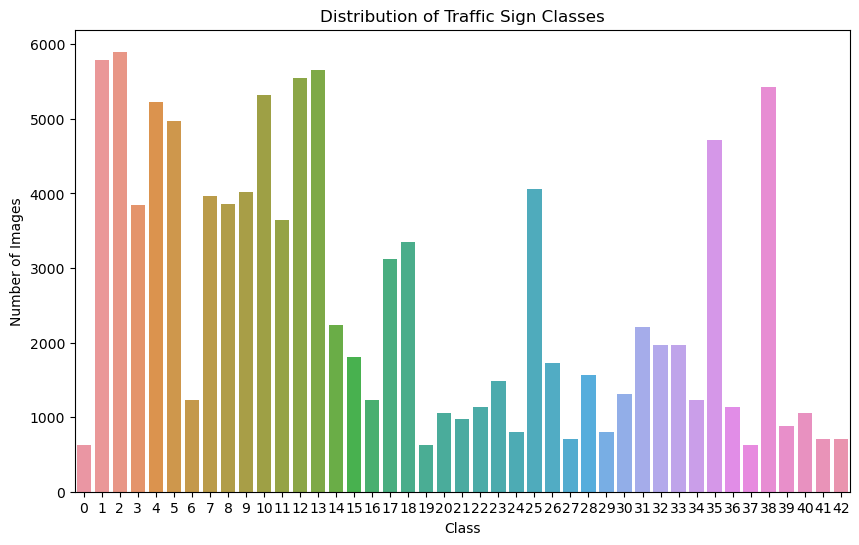

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plotting the distribution of traffic sign classes
plt.figure(figsize=(10, 6))  # Set the size of the figure
sns.countplot(x=labels)  # Create a count plot with class labels on the x-axis
plt.title('Distribution of Traffic Sign Classes')  # Set the title of the plot
plt.xlabel('Class')  # Set the label for the x-axis
plt.ylabel('Number of Images')  # Set the label for the y-axis
plt.show()  # Display the plot


##### 2. Visualizing 5 images from each class from the train set

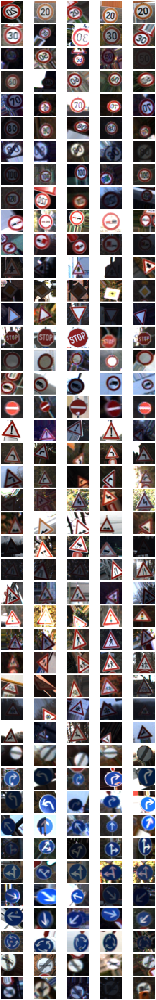

In [11]:
# Create a figure with a grid of subplots
fig, axes = plt.subplots(num_classes, 5, figsize=(15, num_classes * 2))
fig.subplots_adjust(hspace=0.5, wspace=0.5)  # Add space between plots

# Loop through each class
for class_id in range(num_classes):
    # Get the indices of the images that belong to the current class
    class_indices = np.where(labels == class_id)[0]

    # Plot the first 5 images of the current class
    for img_index in range(5):
        ax = axes[class_id, img_index]  # Get the subplot axis for the current class and image index
        if img_index < len(class_indices):
            img = data[class_indices[img_index]]  # Get the image data
            ax.imshow(img)  # Display the image
        ax.axis('off')  # Turn off the axis

        # Add class labels to the first column
        if img_index == 0:
            ax.set_ylabel(f'Class {class_id}', rotation=0, labelpad=40, va='center') 

# Adjust the layout to prevent overlap
plt.tight_layout()

# Display the plot
plt.show()

##### 3. Image Dimensions

In [12]:
# Get the dimensions (height, width, and channels) of each image in the dataset
image_dimensions = [img.shape for img in data]

# Create a DataFrame from the image dimensions
dimensions_df = pd.DataFrame(image_dimensions, columns=['Height', 'Width', 'Channels'])

# Print the summary statistics of the DataFrame
print(dimensions_df.describe())

         Height     Width  Channels
count  110205.0  110205.0  110205.0
mean       30.0      30.0       3.0
std         0.0       0.0       0.0
min        30.0      30.0       3.0
25%        30.0      30.0       3.0
50%        30.0      30.0       3.0
75%        30.0      30.0       3.0
max        30.0      30.0       3.0


##### 4. Color Distribution

<Figure size 1500x700 with 0 Axes>

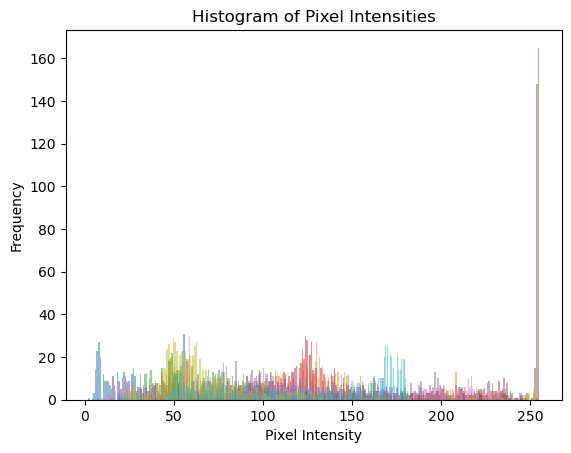

In [13]:
# Convert images from RGB to grayscale to analyze pixel intensity distribution
grayscale_images = [cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) for img in data]

# Plotting the histogram of pixel intensities for the first 10 images
plt.figure(figsize=(15, 7))  # Set the size of the figure
plt.figure(0)  # Create a new figure
for gray_img in grayscale_images[:10]:  # Plotting histograms for the first 10 images as an example
    plt.hist(gray_img.ravel(), bins=256, alpha=0.5)  # Flatten the image array and plot the histogram
plt.title('Histogram of Pixel Intensities')  # Set the title of the plot
plt.xlabel('Pixel Intensity')  # Set the label for the x-axis
plt.ylabel('Frequency')  # Set the label for the y-axis
plt.show()  # Display the plot

##### 5. Summary Statistics

In [14]:
# Flatten the image data to get all pixel values in a single array
pixel_values = data.ravel()

# Calculate and print summary statistics for pixel values
pixel_values_series = pd.Series(pixel_values)
print(pixel_values_series.describe())

# Calculate and print summary statistics for class labels
labels_series = pd.Series(labels)
print(labels_series.describe())

count    2.975535e+08
mean     8.704224e+01
std      7.165379e+01
min      0.000000e+00
25%      3.100000e+01
50%      6.200000e+01
75%      1.260000e+02
max      2.550000e+02
dtype: float64
count    110205.000000
mean         16.460623
std          12.190876
min           0.000000
25%           6.000000
50%          13.000000
75%          26.000000
max          42.000000
dtype: float64


## Splitting data into traning and testing set

In [ ]:
# Checking the shape of data and labels arrays
print(f"Data shape: {data.shape}, Labels shape: {labels.shape}")

# Splitting the dataset into training and testing sets
# 80% of the data will be used for training and 20% for testing
X_train, X_test, y_train, y_test = train_test_split(data, labels, test_size=0.2, random_state=42)

# Displaying the shape of the training and testing sets after the split
print(f"X_train shape: {X_train.shape}, X_test shape: {X_test.shape}")
print(f"y_train shape: {y_train.shape}, y_test shape: {y_test.shape}")

# Converting the labels into one hot encoding
# There are 43 classes, so we use 43 as the number of classes for one hot encoding
y_train = to_categorical(y_train, num_classes=43)
y_test = to_categorical(y_test, num_classes=43)

# Displaying the shape of the one hot encoded labels
print(f"y_train one hot shape: {y_train.shape}, y_test one hot shape: {y_test.shape}")


## Building the CNN model

In [11]:
model = Sequential()

# First convolutional layer with 32 filters, kernel size of 5x5, ReLU activation, and input shape specified
model.add(Conv2D(filters=32, kernel_size=(5, 5), activation='relu', input_shape=X_train.shape[1:]))
# Second convolutional layer with 32 filters and kernel size of 5x5
model.add(Conv2D(filters=32, kernel_size=(5, 5), activation='relu'))
# Max pooling layer with pool size of 2x2
model.add(MaxPool2D(pool_size=(2, 2)))
# Dropout layer to prevent overfitting with a rate of 0.25
model.add(Dropout(rate=0.25))

# Third convolutional layer with 64 filters and kernel size of 3x3
model.add(Conv2D(filters=64, kernel_size=(3, 3), activation='relu'))
# Fourth convolutional layer with 64 filters and kernel size of 3x3
model.add(Conv2D(filters=64, kernel_size=(3, 3), activation='relu'))
# Max pooling layer with pool size of 2x2
model.add(MaxPool2D(pool_size=(2, 2)))
# Dropout layer to prevent overfitting with a rate of 0.25
model.add(Dropout(rate=0.25))

# Flatten layer to convert the 2D matrix to a vector
model.add(Flatten())
# Fully connected layer with 256 units and ReLU activation
model.add(Dense(256, activation='relu'))
# Dropout layer to prevent overfitting with a rate of 0.5
model.add(Dropout(rate=0.5))
# Output layer with 43 units (number of classes) and softmax activation
model.add(Dense(43, activation='softmax'))

# Compilation of the model with categorical crossentropy loss, Adam optimizer, and accuracy as a metric
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Display the model architecture
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 26, 26, 32)        2432      
                                                                 
 conv2d_1 (Conv2D)           (None, 22, 22, 32)        25632     
                                                                 
 max_pooling2d (MaxPooling2  (None, 11, 11, 32)        0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 11, 11, 32)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 9, 9, 64)          18496     
                                                                 
 conv2d_3 (Conv2D)           (None, 7, 7, 64)          36928     
                                                        

## Model architecture

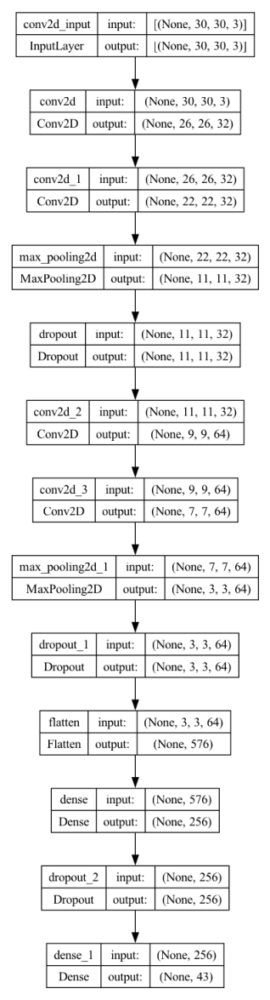

In [12]:
import tensorflow as tf
from tensorflow.keras.utils import plot_model
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Plotting the model architecture to a file named 'model_plot.png'
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Displaying the model plot
plt.figure(figsize=(15, 15))  # Increase the figure size to make the plot larger
# Read the image from the saved file
img = mpimg.imread('model_plot.png')
# Display the image
plt.imshow(img)
# Hide the axes ticks
plt.axis('off')
# Show the plot
plt.show()


## Training the Model

In [13]:
# Uncomment the following lines if you want to ensure the code runs on a GPU.
# with tf.device('/GPU:0'):
#     epochs = 15
#     history = model.fit(X_train, y_train, batch_size=32, epochs=epochs, validation_data=(X_test, y_test))

# Setting the number of epochs for training
epochs = 50

# Training the model using the training data and validating on the test data
history = model.fit(X_train, y_train, batch_size=32, epochs=epochs, validation_data=(X_test, y_test))

# Displaying the training history
print(f"Training completed for {epochs} epochs.")

Epoch 1/50
2756/2756 [==============================] - 199s 72ms/step - loss: 2.6396 - accuracy: 0.2678 - val_loss: 1.8824 - val_accuracy: 0.4165
Epoch 2/50
2756/2756 [==============================] - 183s 66ms/step - loss: 1.8915 - accuracy: 0.4192 - val_loss: 1.4338 - val_accuracy: 0.5487
Epoch 3/50
2756/2756 [==============================] - 185s 67ms/step - loss: 1.6361 - accuracy: 0.4927 - val_loss: 1.2912 - val_accuracy: 0.5904
Epoch 4/50
2756/2756 [==============================] - 176s 64ms/step - loss: 1.5398 - accuracy: 0.5276 - val_loss: 1.2208 - val_accuracy: 0.6255
Epoch 5/50
2756/2756 [==============================] - 208s 75ms/step - loss: 1.4503 - accuracy: 0.5521 - val_loss: 1.0533 - val_accuracy: 0.6687
Epoch 6/50
2756/2756 [==============================] - 183s 67ms/step - loss: 1.3776 - accuracy: 0.5762 - val_loss: 1.0525 - val_accuracy: 0.6736
Epoch 7/50
2756/2756 [==============================] - 175s 63ms/step - loss: 1.3524 - accuracy: 0.5880 - val_loss: 1

## Model accuracy

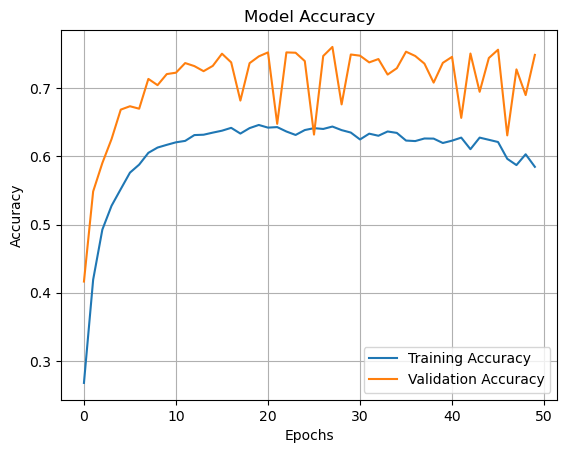

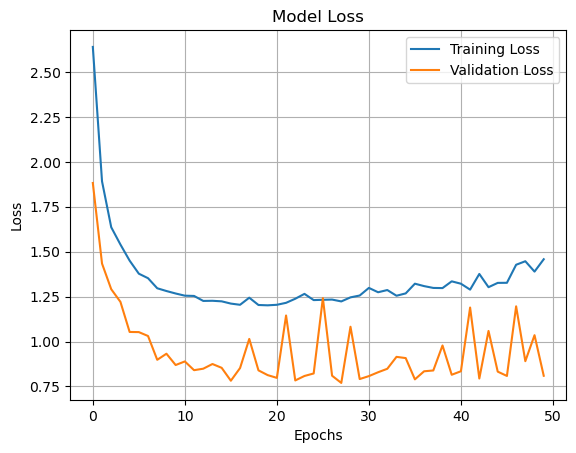

In [14]:
# Plotting performance graphs

# Plotting training and validation accuracy
plt.figure(0)  # Create a new figure
plt.plot(history.history['accuracy'], label='Training Accuracy')  # Plot training accuracy
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')  # Plot validation accuracy
plt.title('Model Accuracy')  # Set the title of the plot
plt.xlabel('Epochs')  # Set the x-axis label
plt.ylabel('Accuracy')  # Set the y-axis label
plt.legend()  # Add a legend to distinguish training and validation accuracy
plt.grid(True)  # Add a grid for better readability
plt.show()  # Display the plot

# Plotting training and validation loss
plt.figure(1)  # Create a new figure
plt.plot(history.history['loss'], label='Training Loss')  # Plot training loss
plt.plot(history.history['val_loss'], label='Validation Loss')  # Plot validation loss
plt.title('Model Loss')  # Set the title of the plot
plt.xlabel('Epochs')  # Set the x-axis label
plt.ylabel('Loss')  # Set the y-axis label
plt.legend()  # Add a legend to distinguish training and validation loss
plt.grid(True)  # Add a grid for better readability
plt.show()  # Display the plot


## Testing model on test data

In [15]:
# Loading the test dataset CSV file
test_csv_path = os.path.join(assets_path, 'Test.csv')
y_test = pd.read_csv(test_csv_path)

# Extracting the class labels and image paths from the CSV
labels = y_test["ClassId"].values
image_paths = y_test["Path"].values

# Initializing an empty list to store the test images
data = []

# Loading and processing the test images
for img_path in image_paths:
    try:
        # Construct the full path to the image file
        full_img_path = os.path.join(assets_path, img_path)
        # Open the image file
        image = Image.open(full_img_path)
        # Resize the image to 30x30 pixels
        image = image.resize((30, 30))
        # Convert the image to a numpy array and append to the data list
        data.append(np.array(image))
    except Exception as e:
        print(f"Error loading image {img_path}: {e}")

# Converting the list of images to a numpy array
X_test = np.array(data)

# Predicting the class labels for the test dataset
with tf.device('/GPU:0'):
    predictions = np.argmax(model.predict(X_test), axis=-1)

print(f"Predictions: {predictions}")

# Calculating the accuracy score of the model on the test dataset
test_accuracy = accuracy_score(labels, predictions)
print(f"Test Accuracy: {test_accuracy:.4f}")


395/395 [==============================] - 4s 9ms/step
Predictions: [16  1 38 ... 32  7 10]
Test Accuracy: 0.9036


## Visualizing the Confusion Matrix using Sankey Plot

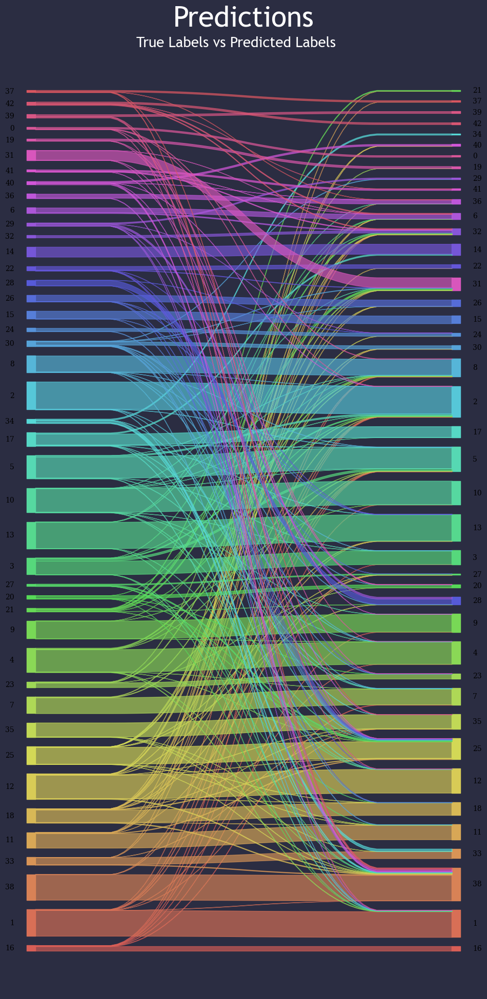

In [16]:
from pySankey.sankey import sankey

# Generating the Sankey diagram
sankey(
    left=labels,          # True labels from the test dataset
    right=predictions,    # Predicted labels by the model
    aspect=20,            # Aspect ratio of the Sankey diagram
    fontsize=10           # Font size for the labels in the diagram
)

# Get the current figure
fig = plt.gcf()

# Set the size of the figure in inches
fig.set_size_inches(12, 24)

# Set the background color of the figure to a dark blue shade
fig.set_facecolor("#2b2d42")

# Set font color to white for better visibility against dark background
plt.rcParams['text.color'] = 'white'
plt.rcParams['axes.titlecolor'] = 'white'
plt.rcParams['axes.labelcolor'] = 'white'

# Set the font family to 'Trebuchet MS'
plt.rcParams['font.family'] = 'Trebuchet MS'

# Set the default font size to 30
plt.rcParams['font.size'] = 30

# Adding a title to the figure
plt.title("Predictions", fontsize=40, fontname='Trebuchet MS', pad=30)

# Adding a subtitle to the figure
plt.suptitle("True Labels vs Predicted Labels", fontsize=20, fontname='Trebuchet MS', y=0.889)

# Saving the figure with a high resolution (800 dpi)
fig.savefig("True_vs_Wrong1.png", bbox_inches="tight", dpi=800)


                             True                            Pred
0  Vehicles > 3.5 tons prohibited  Vehicles > 3.5 tons prohibited
1            Speed limit (30km/h)            Speed limit (30km/h)
2                      Keep right                      Keep right
3                Turn right ahead                Turn right ahead
4    Right-of-way at intersection    Right-of-way at intersection


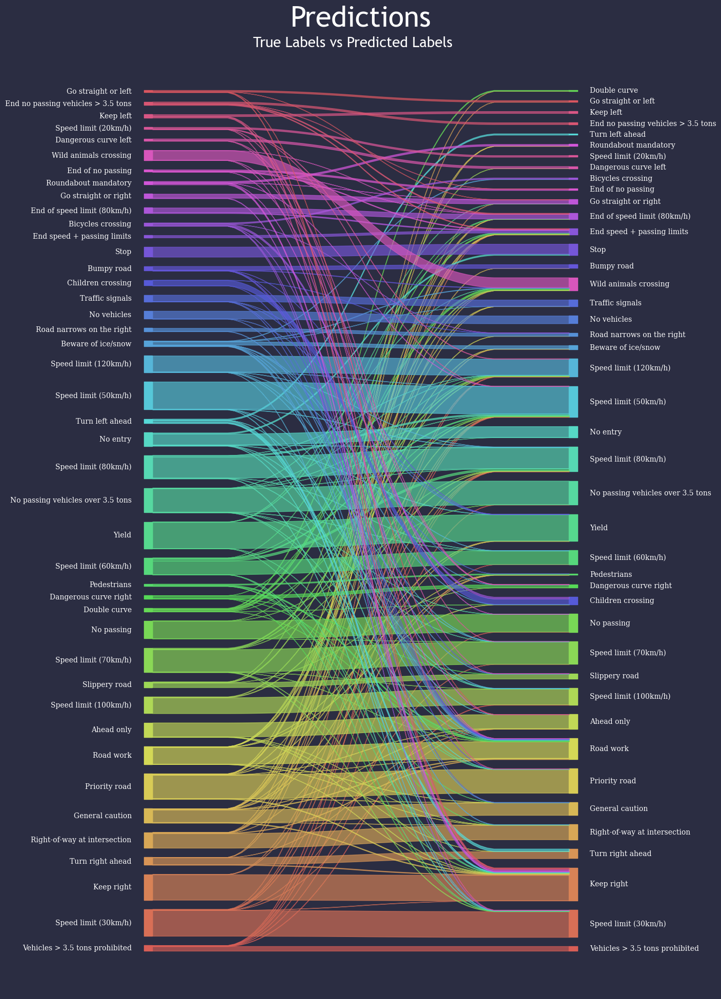

In [19]:
import pandas as pd
import matplotlib.pyplot as plt
from pySankey.sankey import sankey

# Defining the class labels
classes = {
    0: 'Speed limit (20km/h)',
    1: 'Speed limit (30km/h)',
    2: 'Speed limit (50km/h)',
    3: 'Speed limit (60km/h)',
    4: 'Speed limit (70km/h)',
    5: 'Speed limit (80km/h)',
    6: 'End of speed limit (80km/h)',
    7: 'Speed limit (100km/h)',
    8: 'Speed limit (120km/h)',
    9: 'No passing',
    10: 'No passing vehicles over 3.5 tons',
    11: 'Right-of-way at intersection',
    12: 'Priority road',
    13: 'Yield',
    14: 'Stop',
    15: 'No vehicles',
    16: 'Vehicles > 3.5 tons prohibited',
    17: 'No entry',
    18: 'General caution',
    19: 'Dangerous curve left',
    20: 'Dangerous curve right',
    21: 'Double curve',
    22: 'Bumpy road',
    23: 'Slippery road',
    24: 'Road narrows on the right',
    25: 'Road work',
    26: 'Traffic signals',
    27: 'Pedestrians',
    28: 'Children crossing',
    29: 'Bicycles crossing',
    30: 'Beware of ice/snow',
    31: 'Wild animals crossing',
    32: 'End speed + passing limits',
    33: 'Turn right ahead',
    34: 'Turn left ahead',
    35: 'Ahead only',
    36: 'Go straight or right',
    37: 'Go straight or left',
    38: 'Keep right',
    39: 'Keep left',
    40: 'Roundabout mandatory',
    41: 'End of no passing',
    42: 'End no passing vehicles > 3.5 tons'
}

# Creating a DataFrame for predictions
Predictions_df = pd.DataFrame()
Predictions_df['True'] = labels
Predictions_df['Pred'] = predictions

# Mapping the numeric labels to their respective class names
Predictions_df['True'] = Predictions_df['True'].map(classes)
Predictions_df['Pred'] = Predictions_df['Pred'].map(classes)

# Displaying the first few rows of the DataFrame for verification
print(Predictions_df.head())

# Generating the Sankey diagram
sankey(
    left=Predictions_df['True'],  # True labels
    right=Predictions_df['Pred'],  # Predicted labels
    aspect=20,                     # Aspect ratio of the Sankey diagram
    fontsize=10                    # Font size for the labels in the diagram
)

# Get the current figure
fig = plt.gcf()

# Set the size of the figure in inches
fig.set_size_inches(12, 24)

# Set the background color of the figure
fig.set_facecolor("#2b2d42")

# Set the font color to white for better visibility against dark background
plt.rcParams['text.color'] = 'white'
plt.rcParams['axes.titlecolor'] = 'white'
plt.rcParams['axes.labelcolor'] = 'white'
plt.rcParams['axes.labelsize'] = 'large'

# Set the font family to 'Trebuchet MS'
plt.rcParams['font.family'] = 'Trebuchet MS'

# Set the default font size to 30
plt.rcParams['font.size'] = 30

# Adding a title to the figure
plt.title("Predictions", fontsize=40, fontname='Trebuchet MS', pad=30)

# Adding a subtitle to the figure
plt.suptitle("True Labels vs Predicted Labels", fontsize=20, fontname='Trebuchet MS', y=0.889)

# Saving the figure with a high resolution (800 dpi)
fig.savefig("True_vs_Pred.png", bbox_inches="tight", dpi=800)


## Saving the Model

In [18]:
model.save('traffic_classifier.h5')

/Users/jaimismiyani/anaconda3/lib/python3.11/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
